<a href="https://colab.research.google.com/github/tuftsdatalab/gee-land-use-classification/blob/main/Land_cover_classification_with_Google_Earth_Engine_Vernal_Pools.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

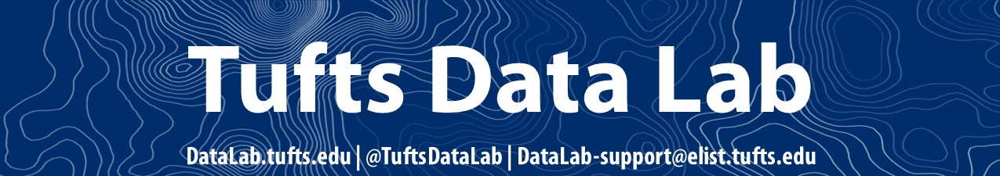

# **Land cover classificaiton with Google Earth Engine - Vernal Pools**

Written by Jon Caris in Java, updated for python 10/22/24 by Chad Fisher

This is a Tufts University Data Lab geospatial notebook based tutorial. You can use it in 2 ways:
1. Use it directly in Google Colab using your Google Account as you are now. You have to make a copy of it to save your work. To make a copy, click on:  ```File -> Save a Copy in Drive ```
2. You can download the tutorial and run it in any python notebook environment, including Jupyter, Spyder, Positron, etc. You may have to install packages that are already installed in Colab and/or have limited functionality as the tutorial as been designed for Colab. To download the tutorial notebook, click on ```File -> Download -> Download .ipynb ```

## Introduction

For the first part of this lab, you will be using satellite imagery in Google Earth Engine to train a model on how to classify various land covers. You will be using supervised classification, which is an image classification technique that relies on your own human knowledge to guide the model towards the land covers you want to classify. You will select sample points on your image for each land cover class (you will use urban, water, and forest as your three classes today, but there are many more ways to classify land cover) to create training data. The model will look at the spectral characteristics of the pixels at the points you selected in this training data to determine where else on the image the pixels match for each group. Then, the model can display a colored map where each land cover class appears as a different color.

Repeating this process on another satellite image that was taken at the same place but in another point in time allows you to compare land cover changes over time. Doing so allows for the observation of water source changes, deforestation, urbanization, and more in a certain area. You won’t be doing this with satellite imagery today, but you will be able to classify and compare drone imagery.

## Getting Started in Google Earth Engine

1. Open [Google Earth Engine](https://earthengine.google.com) in your web browser. Click on *get started* in the top right corner.

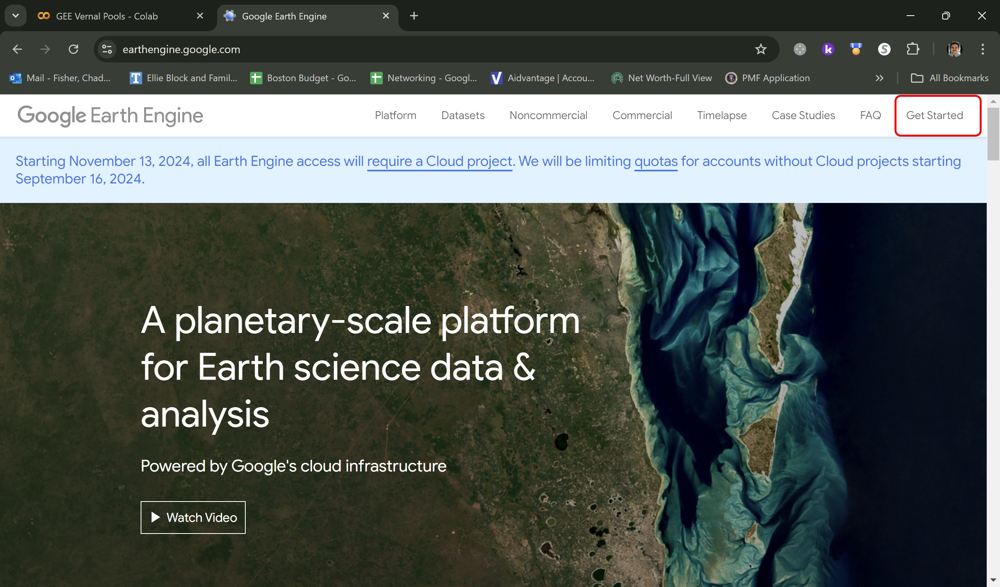

2. It should take you to this screen. Click on **register a commercial or noncommercial project**.

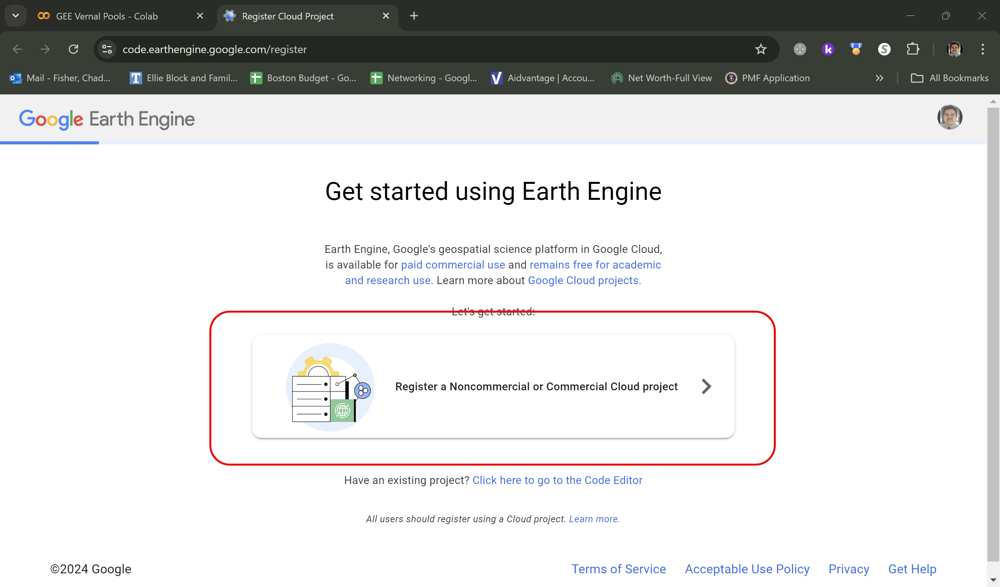

3. Select *unpaid use* and then *Academia & Research* on the screen. Click next

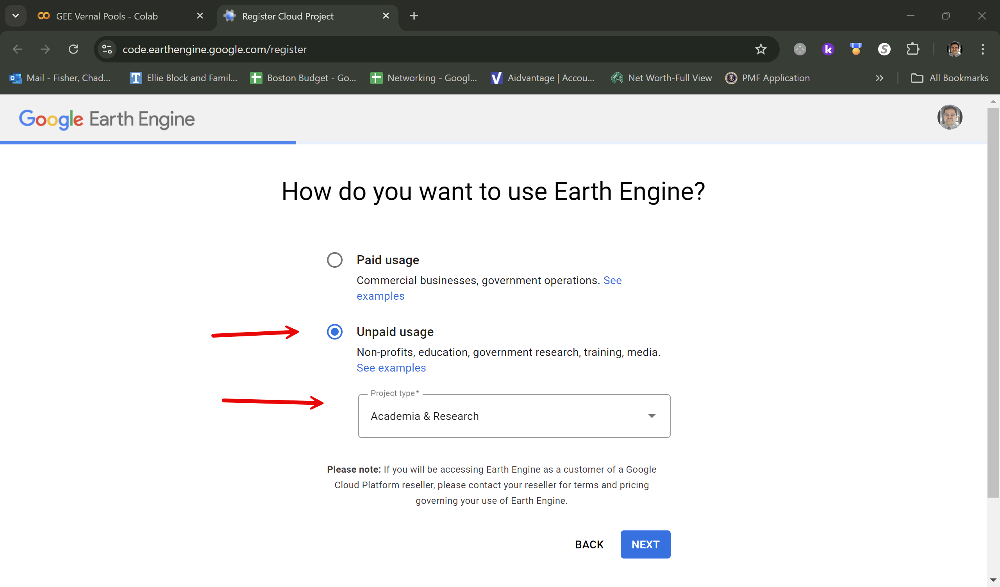

4. Select **create a new Google Cloud Project** and rename the *Project Name* to something descriptive like **Land Classification Lab**.

*Note*: if you've previously created a GEE project, you'll have to change the *Project ID* from its default.

5. Click **Continue to Summary**

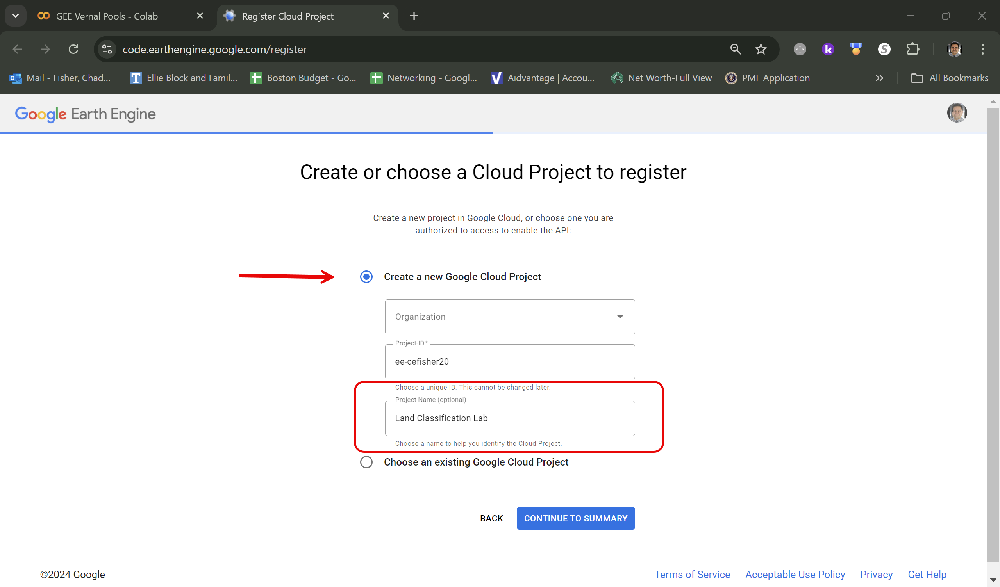

6. Confirm your project details and click **confirm** to create your project.

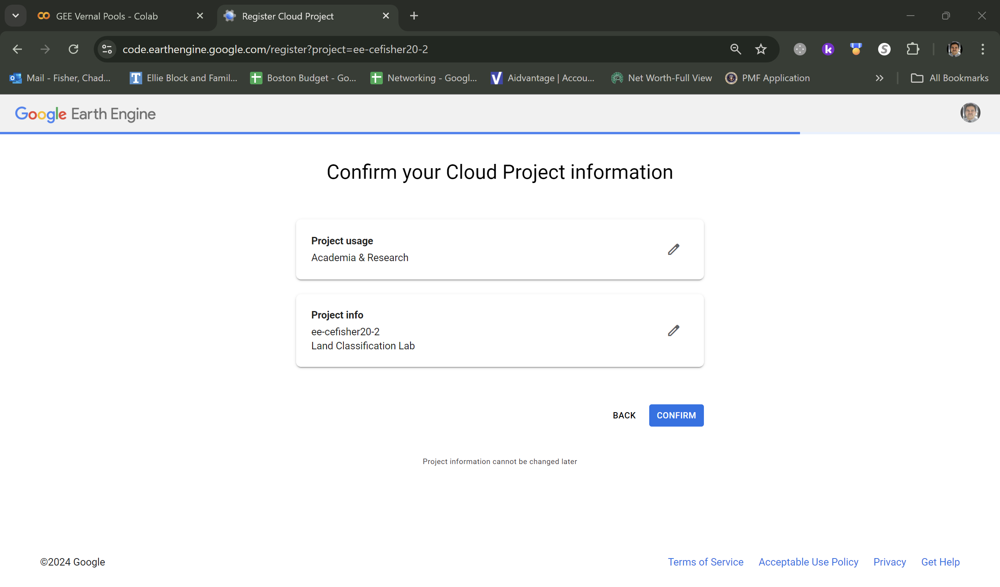

7. This will automatically open a new script in Earth Engine. This editor uses javascript, but to make it easier, we can access our project through Google Colab and code in python instead. That is how this tutorial will proceed.

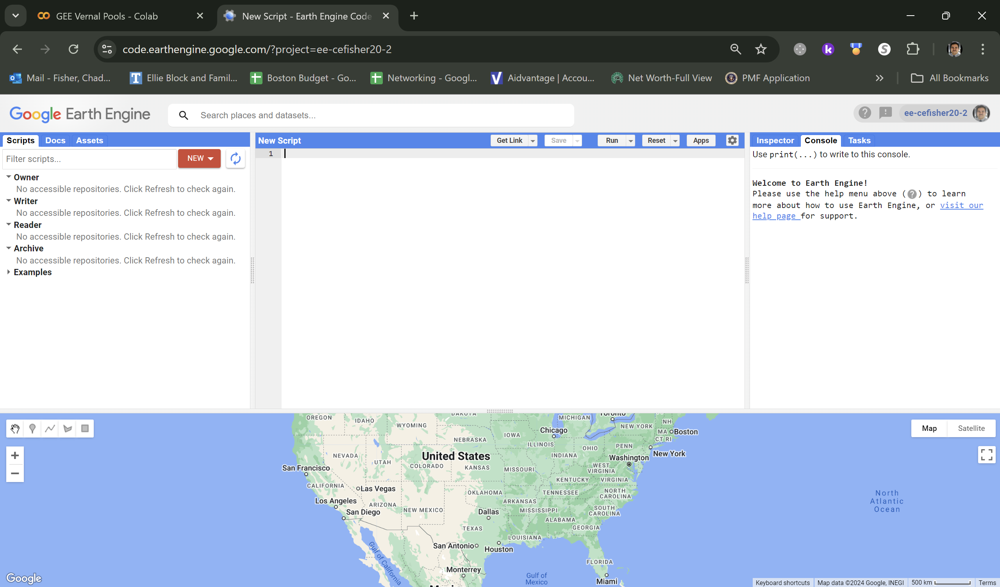

8. Make sure to remember your *Project-ID* for the next section of the tutorial! Mine was **ee-cefisher-20-2**

## Setting up your own notebook

In this section, you will create a copy of the notebook and connect your notebook to your GEE project.

1. In Colab, go to **File** -> **Save a Copy in Drive**

2. A new window will open with the notebook automatically named as **Copy of GEE Vernal Pools** as default. Rename your notebook to **GEE Vernal Pools - LastName**. (Crabs, Dogs, and Cats not required)

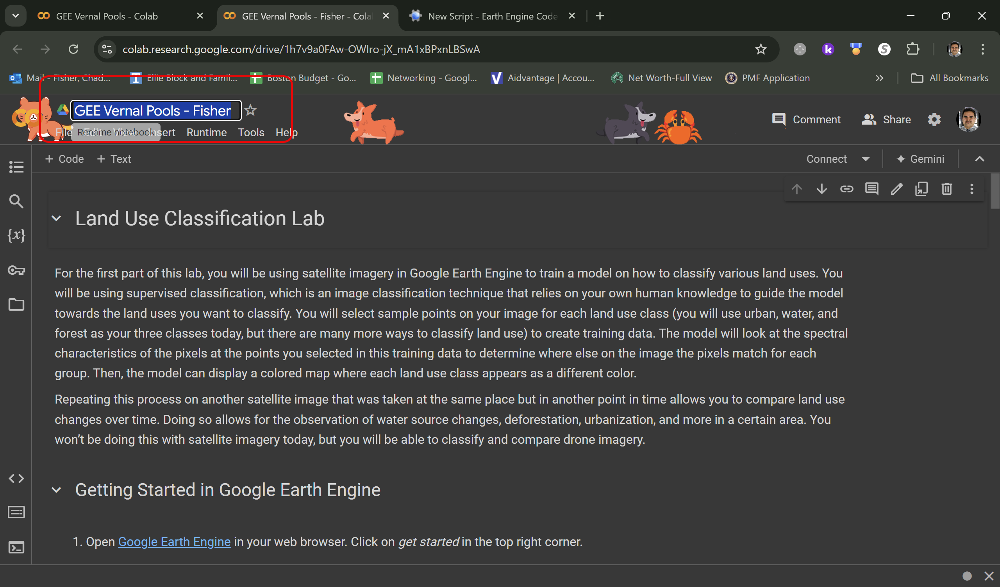

3. Once your copy is up and running, you can switch to the copy and continue the lab from here.

In [ ]:
# Import Earth Engine API package
import ee

4. ee is a python library that connects to Earth Engine. Run the code below to learn what is in the package or see its [documentation](https://developers.google.com/earth-engine/guides/python_install) to learn more.

In [ ]:
help(ee)

Help on package ee:

NAME
    ee - The EE Python library.

PACKAGE CONTENTS
    _arg_types
    _cloud_api_utils
    _helpers
    _utils
    apifunction
    apitestcase
    batch
    blob
    classifier
    cli (package)
    clusterer
    collection
    computedobject
    confusionmatrix
    customfunction
    data
    daterange
    deprecation
    deserializer
    dictionary
    ee_array
    ee_date
    ee_exception
    ee_list
    ee_number
    ee_string
    ee_types
    element
    encodable
    errormargin
    feature
    featurecollection
    filter
    function
    geometry
    image
    image_converter
    imagecollection
    join
    kernel
    mapclient
    model
    oauth
    pixeltype
    projection
    reducer
    serializer
    table_converter
    terrain

SUBMODULES
    types

FUNCTIONS
    Authenticate(authorization_code: Optional[str] = None, quiet: Optional[bool] = None, code_verifier: Optional[str] = None, auth_mode: Optional[str] = None, scopes: Optional[Sequence[str]

5. Now we have to connect our notebook to Earth Engine. First, we authenticate to our account.

In [ ]:
# Authenticate: this will open a new window.
ee.Authenticate()

True

6. Click **Allow**.

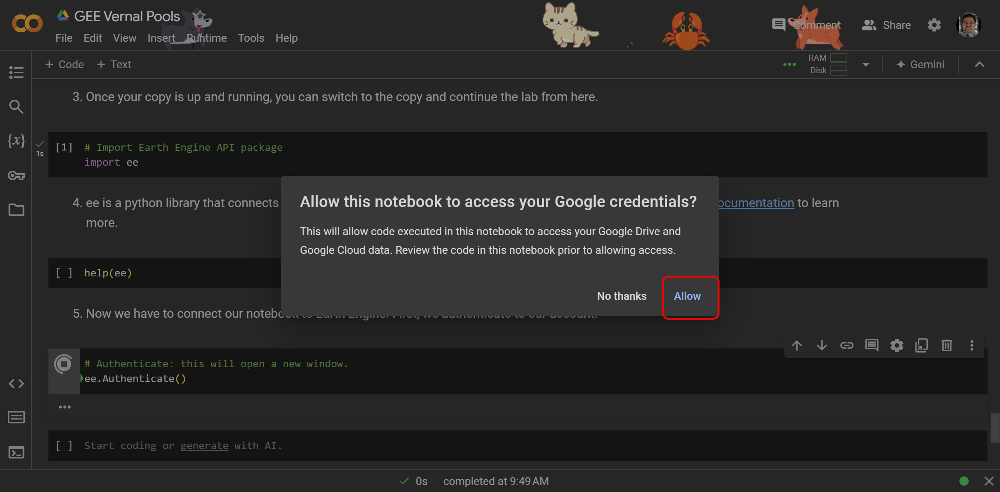

7. Select the account you made your project in and click through all the screens by clicking **Continue** on each of the 3 screens. The window should automatically close and return you to your notebook.

8. Check that the authentication worked by running ee.Authenticate again.

In [ ]:
# Check authentication
ee.Authenticate()

True

9. Initialize your project using your *Project-ID* from the previous section.

In [ ]:
# Initialize: put your project-ID inside the parentheses
ee.Initialize(project='???')

10. Now the fun can begin!

## Selecting an Area to Classify

Today, you’ll use satellite imagery from the area of the MacLeish Field Station. From the starting map, zoom in on Massachusetts until you can find Northampton. To the north of Northampton, you will find *West Whately*, where the station is located.

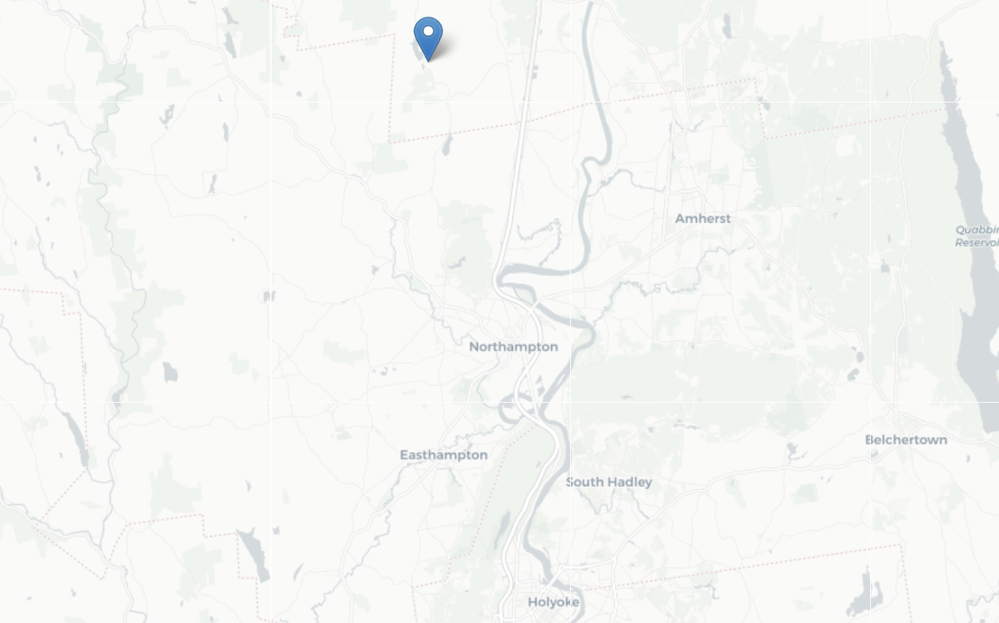



1. First we need to create an interactive map to locate our points of interest. We can import a different package called geemap and create a map.

In [ ]:
# Import
import geemap

# Also import the underlying mapping package
import ipyleaflet

In [ ]:
# Initialize a map
m = geemap.Map(center=[42.317679, -72.636931], zoom=11,basemap='CartoDB.Positron')
m

Map(center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Sea…

2. This map is interactive and you can move around in it, create polygons and points, etc. Open the map again and this time place a marker as close as possible to MacLeish Field Station. **Hint:** the globe in the top right of the map is a search tool and you can always search for the location (West Whately, MA) if you're having trouble finding it.

In [ ]:
# Open map and place point on MacLeish Field Station
m

Map(bottom=194301.0, center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent…

3. Save your ROI. You will use it to download satellite imagery for our area of interest.

In [ ]:
ROI=m.get_draw_control().last_draw['geometry']

## Import Satellite Imagery

One nice feature when using Google Earth Engine is that you can import satellite imagery directly without having to download any large files. Now you will import satellite imagery covering the MacLeish area between the beginning of March and the end of June 2021. You are providing a large window of time in order to find an image with as few clouds as possible, since clouds would obstruct the view and affect the classification.

**Do you think clouds would be an issue when classifying imagery taken from a drone?**


1. Run the following code to access satellite imagery

In [ ]:
# Access Landsat
image = ee.Image(ee.ImageCollection('LANDSAT/LC08/C02/T1_L2') #access specific image collection, read more: https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C02_T1_L2#description
    .filterBounds(ROI) #Contains our point of interest
    .filterDate('2021-03-01', '2021-06-30') # date range of images
    .sort('CLOUD_COVER') #sort by percentage cloud cover
    .first()) # take imager with lowest cloud cover

2. Earth Engine images are not downloaded but simply referenced. You can see the metadata about the image if you call it. Some key points on the metadata:

  *   Image id: the collection is followed by the image name which incluces the data of the image (05/15/2021)
  *   Bands: all of the bands in the image are listed including their name, data type, projection, and size. **How many bands are in this image?**
  *   Properties: lots of additional information like cloud cover percentage, data source, time, scale information, and image footprint


In [ ]:
#See information about the imagery
image

3. Add imagery to map

In [ ]:
m.addLayer(image, {'bands': ['SR_B4', 'SR_B3', 'SR_B2'],'min':0, 'max': 3000}, 'Satellite image')
m

Map(bottom=194301.0, center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent…

4. You'll just see a huge white square. What's up with that? Let's check the band documentation and code samples from the data catalog.

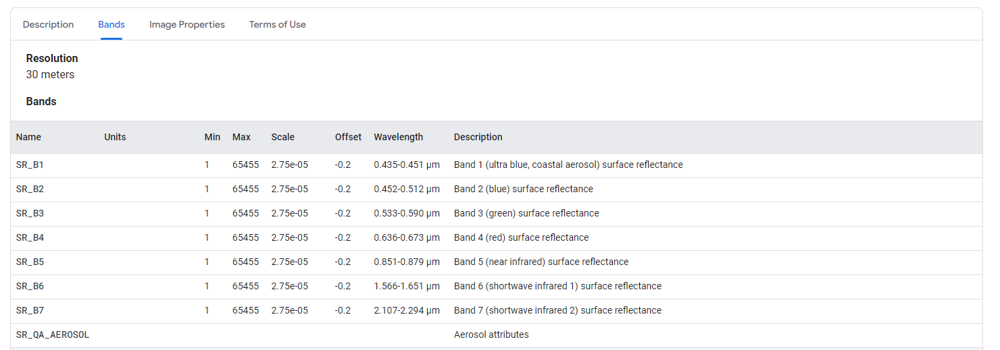

We need to scale and use the offset to convert to reflectance values. Scrolling down to the code sample, we see:

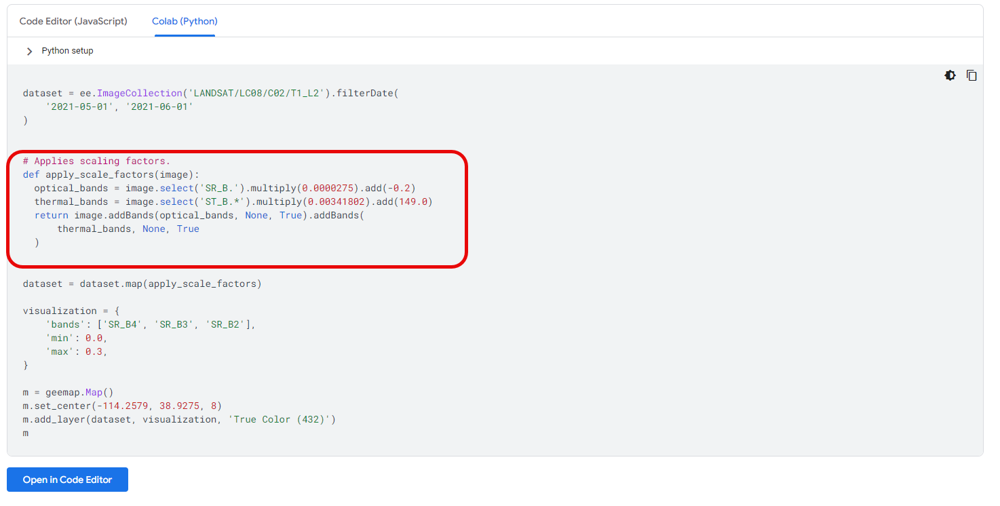

5. Create a function to scale your image

In [ ]:
def apply_scale_factors(image):
  optical_bands=image.select('SR_B.').multiply(0.0000275).add(-0.2)
  return image.addBands(optical_bands, None, True)

6. Scale image

In [ ]:
scaled_image=apply_scale_factors(image)

7. Remove unscaled image and add back in scaled image to map

In [ ]:
m.remove_layer('Satellite image')
m.addLayer(scaled_image, {'bands': ['SR_B4', 'SR_B3', 'SR_B2'],'min':0, 'max': 0.3}, 'Satellite image (scaled)')
m

Map(bottom=194301.0, center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent…

Zoom out until you can see all of the bounds of the image.

**Do you think a drone could capture an image covering this much area with one flight? How many drone flights do you think it would take to cover an area of this size?**

Now zoom in on your marker to see the resolution of the image.

**Can you spot any plants well enough to identify them? Can you identify individual buildings?**

## Creating training data

1. Clear your drawing and add your saved ROI point to your map.

In [ ]:
m.get_draw_control().clear()
m.add(ipyleaflet.GeoJSON(data=ROI,name='ROI'))
m

Map(bottom=194301.0, center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent…

2. Now we can start collecting our sample points for urban, water, and forest. Open the map with your ROI on it. We are going to start marking points that represent 'urban' areas. **Add 25 markers for urban spaces.** If you are getting distracted by the ROI point, you can turn it on and off in the top right corner of the map!

In [ ]:
m

Map(bottom=194301.0, center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent…

4. Now we can save our drawn features and clear them so we can do the water sample points.

In [ ]:
Urban_Samples=m.get_draw_control().data

In [ ]:
m.get_draw_control().clear() # You may have to run this twice if the points don't clear
m

Map(bottom=194098.0, center=[42.42041523948996, -72.49325703789656], controls=(WidgetControl(options=['positio…

5. Save Water sample points, once you've added 25 water sample points on the map above.

In [ ]:
Water_Samples=m.get_draw_control().data

In [ ]:
m.get_draw_control().clear()
m

Map(bottom=194098.0, center=[42.42041523948996, -72.49325703789656], controls=(WidgetControl(options=['positio…

6. Save Forest sample points, once you've added 25 sample points on the map above.

In [ ]:
Forest_Samples=m.get_draw_control().data

In [ ]:
m.get_draw_control().clear()
m

Map(bottom=194098.0, center=[42.42041523948996, -72.49325703789656], controls=(WidgetControl(options=['positio…

7. To add class information to our training data and format it for Earth Engine, we will import two packages: geopandas and pandas.

In [ ]:
import geopandas as gpd
import pandas as pd

8. Each of these code chunks turns our saved data into a GeoDataFrame, a common spatial data format in python. Then, we add an attribute for each of the classes - water (0), urban (1), and forest (2). Finally, we only select the geometry and class information from the dataframe.

In [ ]:
# Convert to GeoDataFrame
Water_gdf = gpd.GeoDataFrame.from_features(Water_Samples)

# Assign class value
Water_gdf['class']=0

# Only extract the columns of interest
Water_gdf=Water_gdf[['geometry','class']]

In [ ]:
Urban_gdf = gpd.GeoDataFrame.from_features(Urban_Samples)
Urban_gdf['class']=1
Urban_gdf=Urban_gdf[['geometry','class']]

In [ ]:
Forest_gdf = gpd.GeoDataFrame.from_features(Forest_Samples)
Forest_gdf['class']=2
Forest_gdf=Forest_gdf[['geometry','class']]

9. Now we combine our training data into a single dataset with pandas' concat function. We also have to assign a coordinate system for the dataframe. Our created Earth Engine data was in EPSG 4326 (aka WGS 84). **Do the counts for each class match the number of samples you placed?**

In [ ]:
All_gdf=pd.concat([Water_gdf,Urban_gdf,Forest_gdf])
All_gdf.crs='EPSG:4326'
All_gdf['class'].value_counts()

,count
class,
1,16
0,13
2,12


10. Finally, we create our training data by extracting the spectral information for our training locations. Explore what the training data Feature Collection contains.

In [ ]:
bands = ['SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']
training = scaled_image.select(bands).sampleRegions(geemap.geopandas_to_ee(All_gdf))
training

## Train your classifier

With your training data created, you can finally have the model classify the different land covers in your image. The next code chunk will train the model to look for pixels with similar properties to the pixel you identified while marking points. Select run to train your model.

1. Run the following code to train you CART classifier. There are many different [classifiers available in Earth Engine.](https://https://developers.google.com/earth-engine/apidocs/ee-classifier-amnhmaxent)

In [ ]:
trained = ee.Classifier.smileCart().train(training,'class',bands)

2. What does the trained classifier object look like? Run the code to see its metadata:

In [ ]:
trained

3. Now, use your trained classifier on your scaled imagery and add it to the map!

In [ ]:
classified = scaled_image.select(bands).classify(trained);

m.addLayer(classified,
{'min': 0, 'max': 2, 'palette': ['blue', 'red', 'green']},
'Satellite classification')
m

Map(bottom=775327.0, center=[42.44131511136719, -72.79351820877416], controls=(WidgetControl(options=['positio…

To compare your classified map with the original image, in the layers floating panel, adjust down the opacity slider for your classified image.

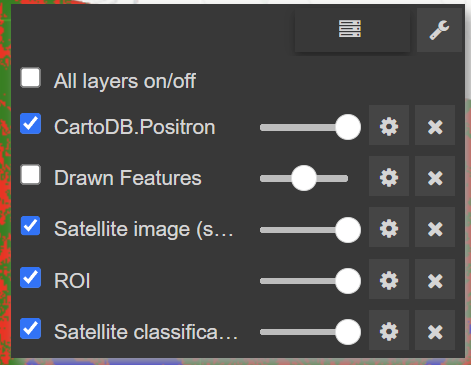

**What do you notice about the areas classified as urban? Are there clouds in your original image that were classified as urban areas?**

**What other limitations can you think of when classifying a satellite image that may not occur when working with drone imagery?**

# Using Drone Imagery

With Google Earth Engine, you can also import your own imagery to display and classify. For the next portion of this lab, you will classify and then compare two drone images of a vernal pool at the MacLeish Field Station.

1. Read **MacLeish_Fall_202011210.tif** into Earth Engine by uploading an asset to your project.
  * It can be downloaded from [Box](https://tufts.box.com/s/92osodsaoo2rf3gr6vgztq5nefxjzd8n)
  * Go to [code.earthengine.google.com](https://code.earthengine.google.com)
  * On the **Assets** tab on the left, click on **Upload** and select **GeoTIFF**

  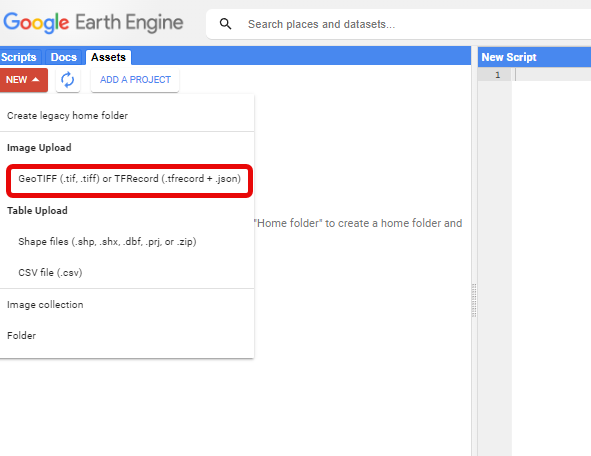

2. On the **Upload a new image asset** pop-up, click **Select** and navigate to *MacLeish_Fall_20201110.tif*. You can leave the defaults and click **Upload**.

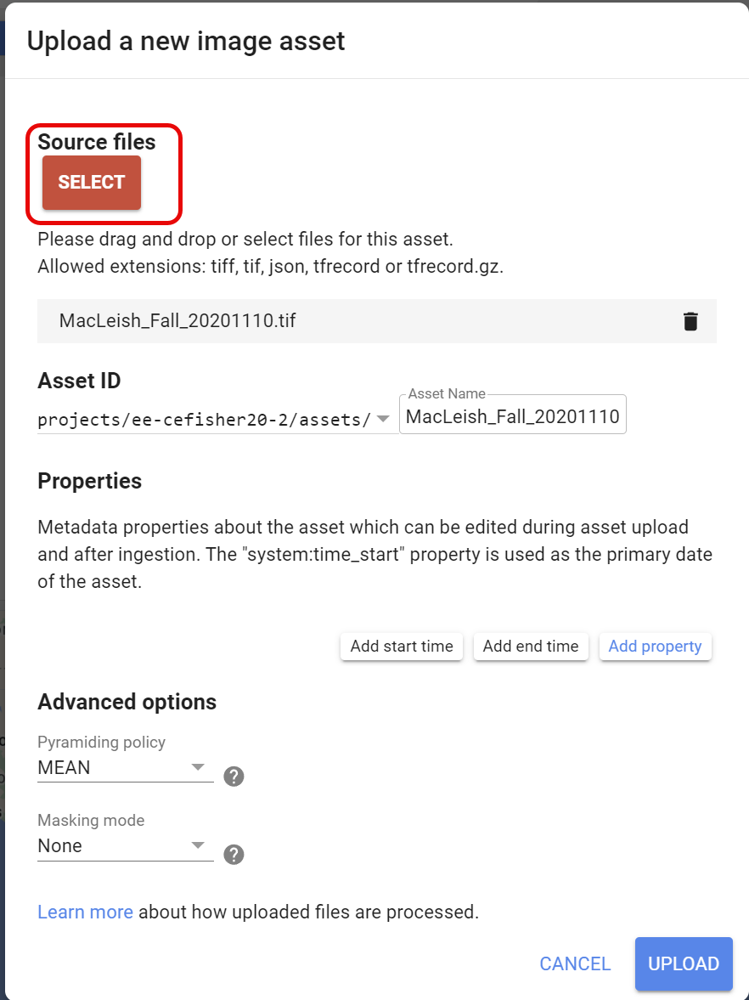

3. You can track the upload's progress on the **tasks** tab on the right of the screen.
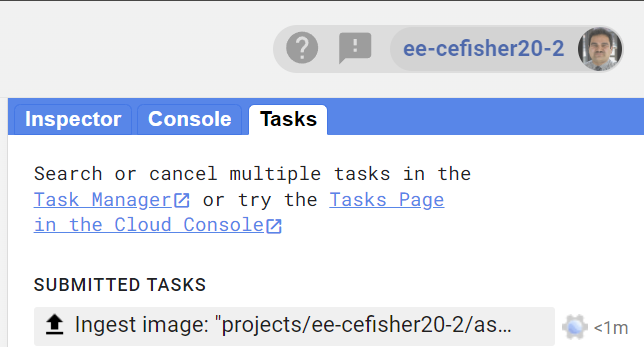

4. Once complete, go to your **Assets** on the left and refresh them if you don't see your image yet.

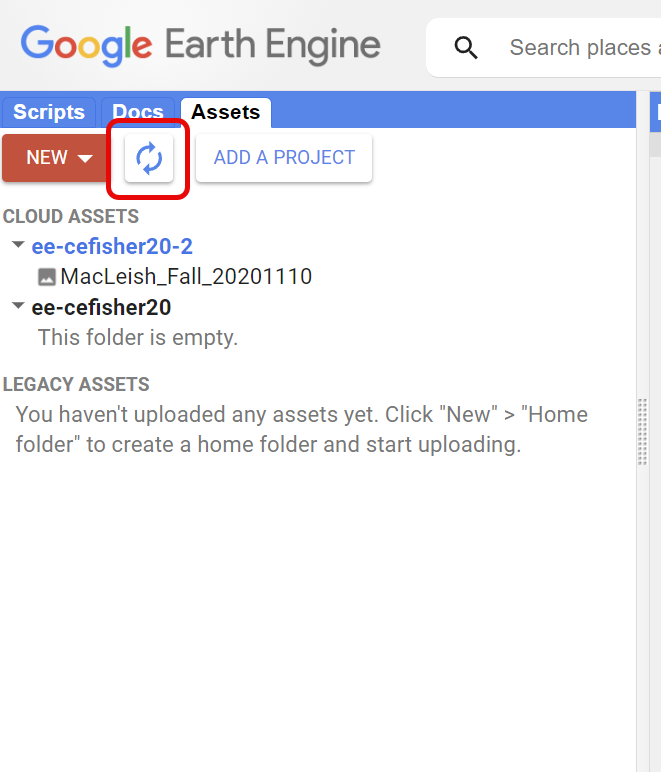

5. Click on the image and copy the image ID. Then, return to your Colab notebook.

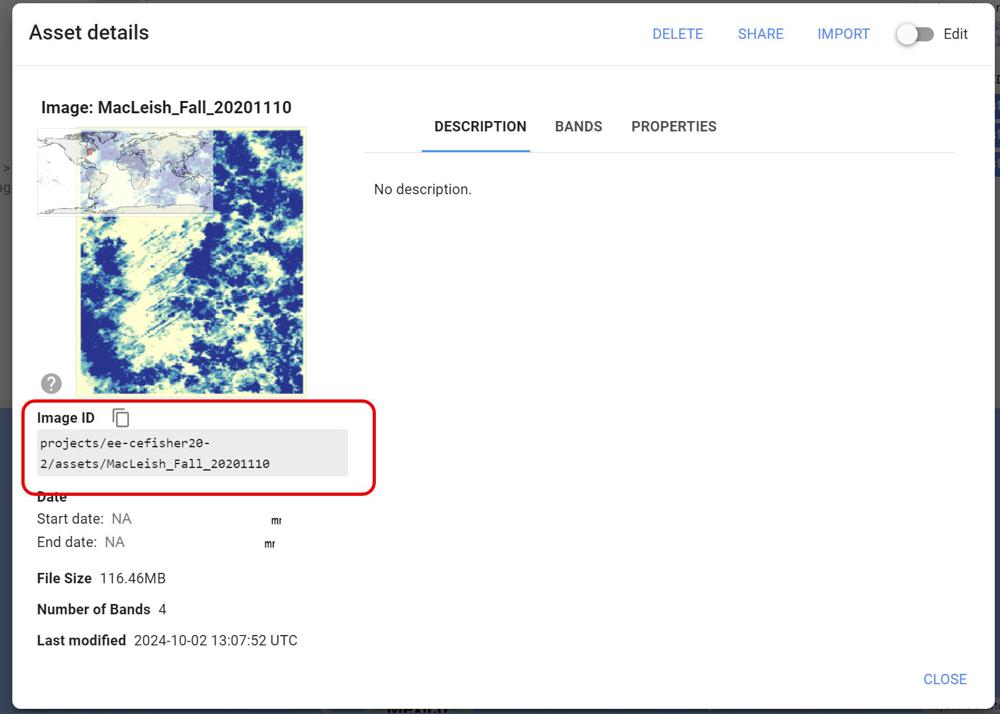

6. Read your image as a new variable by typing your image ID in below:

In [ ]:
MacLeish_Fall=ee.Image('your image ID here')

7. Open a new map of your study area:

In [ ]:
m2 = geemap.Map(center=[42.317679, -72.636931], zoom=12,basemap='CartoDB.Positron')
m2

Map(center=[42.317679, -72.636931], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Sea…

In [ ]:
# Add your uploaded image to the map
m2.addLayer(MacLeish_Fall,{'min':0,'max':255},'MacLeish fall')

# Center map on the image
m2.centerObject(MacLeish_Fall,19)

# Show the map
m2

Map(bottom=388301.0, center=[42.44950728379967, -72.68363717039847], controls=(WidgetControl(options=['positio…

**How does the extent and spatial resolution of the drone image on the map compare to the satellite image you worked with?**

## Creating Training Data

Creating the training data for the drone image will be a very similar process to creating the training data for the satellite image. For this image, you will be using different land classes because the spatial resolution of a drone image allows you to see significantly more detail. Instead of urban, water, and forest, you will make classes for ground, trees, and water.

You might notice that the image you just imported does not seem to contain any water. For this part of the lab, you will create two sets of training data from the two drone images you are going to compare. You can train the same model several times to increase its accuracy and add additional classes that are not present in a single image!

### Fall Training Data

We will follow the same process as for the satellite image, but use ~15 points per class. For the Fall data, we will only create points for ground and trees.

1. Open the map and put 15 points for the ground class on the map. *Remember you can erase specific points using the trashcan and edit these until you are satisfied*. Your points might look like this:

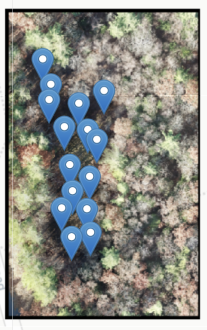

In [ ]:
m2

Map(bottom=24799096.0, center=[42.44950725807221, -72.68363982439043], controls=(WidgetControl(options=['posit…

2. Once you are happy with your 15 points, save them by running the following code:

In [ ]:
Ground_Fall_Samples=m2.get_draw_control().data

3. Clear the ground points off your map:

In [ ]:
m2.get_draw_control().clear()
m2

Map(bottom=6199999.0, center=[42.44950725807221, -72.68363714218141], controls=(WidgetControl(options=['positi…

4. Now create 15 points for your trees on the map below.

In [ ]:
m2

Map(bottom=24799150.0, center=[42.449293484391134, -72.68356832987142], controls=(WidgetControl(options=['posi…

5. Once you are happy with your 15 points, save them by running the following code:

In [ ]:
Trees_Fall_Samples=m2.get_draw_control().data

6. Now reformat and combine your data. We will use the following codes for our classes: ground (0), forest (1), water (2)

In [ ]:
Ground_Fall_gdf = gpd.GeoDataFrame.from_features(Ground_Fall_Samples)
Ground_Fall_gdf['class']=0
Ground_Fall_gdf=Ground_Fall_gdf[['geometry','class']]

In [ ]:
Trees_Fall_gdf = gpd.GeoDataFrame.from_features(Trees_Fall_Samples)
Trees_Fall_gdf['class']=1
Trees_Fall_gdf=Trees_Fall_gdf[['geometry','class']]

In [ ]:
Fall_gdf=pd.concat([Ground_Fall_gdf,Trees_Fall_gdf])
Fall_gdf.crs='EPSG:4326'
Fall_gdf['class'].value_counts()

,count
class,
0,15
1,15


7. Create the final fall training dataset by extracting spectral data using our sample points:

In [ ]:
drone_bands = ['b1', 'b2', 'b3', 'b4']
falltraining = MacLeish_Fall.select(drone_bands).sampleRegions(geemap.geopandas_to_ee(Fall_gdf))
falltraining

### Spring Training Data

Now we will collect our spring training data

1. Upload **MacLeish_Spring_20210330.tif** as a new asset in your GEE project. https://code.earthengine.google.com/
  * It can be downloaded from [Box](https://tufts.box.com/s/ookstp4szinax4rg886jqiuf8ku4zx7s)

2. Once the upload is complete, find the image ID and bring it back to your notebook and import the image below:

In [ ]:
MacLeish_Spring=ee.Image('your spring image ID')

3. Open a new map of your study area, add the image, and center the map on it:

In [ ]:
m3 = geemap.Map(center=[42.317679, -72.636931], zoom=12,basemap='CartoDB.Positron')
m3.addLayer(MacLeish_Spring,{'min':0,'max':255},'MacLeish spring')
m3.centerObject(MacLeish_Spring,19)
m3

Map(center=[42.44952307723228, -72.68365861952263], controls=(WidgetControl(options=['position', 'transparent_…

4. Start by collecting points for bare gound. There isn't a lot, but focus on the edges of the image to find at least 5 spots.

In [ ]:
m3

Map(bottom=49597905.0, center=[42.44948152940204, -72.68349233135376], controls=(WidgetControl(options=['posit…

5. Save your 5 ground points from the spring data and clear your markers from the map:

In [ ]:
Ground_Spring_Samples=m3.get_draw_control().data

In [ ]:
m3.get_draw_control().clear()

6. Now select 15 points for trees from the image:

In [ ]:
m3

Map(bottom=49597898.0, center=[42.44949538330266, -72.68338498607484], controls=(WidgetControl(options=['posit…

7. Save your forest points and clear the markers from the map:

In [ ]:
Trees_Spring_Samples=m3.get_draw_control().data

In [ ]:
m3.get_draw_control().clear()

8. Finally, collect 15 points for water:

In [ ]:
m3

Map(bottom=49597906.0, center=[42.44947955027314, -72.6834684163918], controls=(WidgetControl(options=['positi…

9. Save your water points and clear:

In [ ]:
Water_Spring_Samples=m3.get_draw_control().data

In [ ]:
m3.get_draw_control().clear()

10. Reformat your data, add land cover classes, and combine your data:

In [ ]:
Ground_Spring_gdf = gpd.GeoDataFrame.from_features(Ground_Spring_Samples)
Ground_Spring_gdf['class']=0
Ground_Spring_gdf=Ground_Spring_gdf[['geometry','class']]

In [ ]:
Trees_Spring_gdf = gpd.GeoDataFrame.from_features(Trees_Spring_Samples)
Trees_Spring_gdf['class']=1
Trees_Spring_gdf=Trees_Spring_gdf[['geometry','class']]

In [ ]:
Water_Spring_gdf = gpd.GeoDataFrame.from_features(Water_Spring_Samples)
Water_Spring_gdf['class']=2
Water_Spring_gdf=Water_Spring_gdf[['geometry','class']]

In [ ]:
Spring_gdf=pd.concat([Ground_Spring_gdf,Trees_Spring_gdf,Water_Spring_gdf])
Spring_gdf.crs='EPSG:4326'
Spring_gdf['class'].value_counts()

,count
class,
1,15
2,15
0,5


7. Create the final spring training dataset by extracting spectral data using our sample points:

In [ ]:
drone_bands = ['b1', 'b2', 'b3', 'b4']
springtraining = MacLeish_Spring.select(drone_bands).sampleRegions(geemap.geopandas_to_ee(Spring_gdf))
springtraining

## Classifying drone images

With the satellite image, you trained the model on a single data set created from a single image. To train the model to classify the drone images, you will train the model twice on two different data sets created from two different images. Models like this are typically trained extensively using much larger data sets than you have created here.

1. Train your classifier on both training datasets:

In [ ]:
fallTrained = ee.Classifier.smileCart().train(falltraining, 'class', drone_bands)
bothTrained = fallTrained.train(springtraining, 'class', drone_bands)

2. Classify both of your images using the classifier trained on both datasets:

In [ ]:
fallClassified = MacLeish_Fall.select(drone_bands).classify(bothTrained)
springClassified = MacLeish_Spring.select(drone_bands).classify(bothTrained)

3. Add both images to a new map. Remember you can turn layers on or off on the side as well as adjust the opacity.

In [ ]:
m4 = geemap.Map(center=[42.317679, -72.636931], zoom=12,basemap='CartoDB.Positron')
m4.addLayer(fallClassified,{'min': 0, 'max': 2, 'palette': ['tan', 'green', 'blue']},'Fall classification')
m4.addLayer(springClassified,{'min': 0, 'max': 2, 'palette': ['tan', 'green', 'blue']},'Spring classification')
m4.centerObject(springClassified,19)
m4

Map(center=[42.44952307723228, -72.68365861952263], controls=(WidgetControl(options=['position', 'transparent_…

# Comparing your Results

Now, let's compare all of our results.

1. Create a map with your scaled satellite image, classified satellite image, fall and spring drone images, and the classified drone images:

In [ ]:
m5=geemap.Map(center=[42.317679, -72.636931], zoom=12,basemap='CartoDB.Positron')

# Find the layer additions codes from earlier in the tutorial for each
# Add scaled image
m5.addLayer('')
# Add classified satelitte image
# Add fall image
# Add spring image
# Add classified fall image
# Add classified spring image

m5.centerObject(springClassified,19)
m5

NameError: name 'scaled_image' is not defined

Hide the satellite layers for now by unchecking their boxes in the layers panel. Hide the drone image and classification for spring by unchecking those boxes as well.

Compare your fall classification with the original image by dragging the opacity slider next to the classification layer back and forth.

**How well do you think your classifier did? What parts of the image do you think were misclassified, and why could this have happened?**

In [ ]:
m5


Now uncheck the boxes for the fall layers and check the boxes next to the spring boxes. Do the same comparison between the image and the classification by dragging the opacity slider on the spring classification layer.

**Do you think your classifier did better, the same, or worse for the spring image? Why?**

In [ ]:
m5

Now, check only the boxes to display the spring drone classification and the satellite classification. Drag the opacity slider back and forth on the spring classification layer to compare the vernal pool from the satellite with the drone.

**How does the level of detail differ between these two classifications? If you were interested in seeing how this pool changed from the fall to the spring, which kind of image do you think would be more useful to base your classification on: the satellite or the drone image?**

# Conclusion

Now you’ve experienced firsthand how to create training data, train a land classification model, and apply the model to two different types of imagery. Both drone and satellite image classifications are useful for their own unique reasons and applications, and hopefully you have thought about the benefits and limitations of each type of image.